In [5]:
import os
import random
import numpy as np
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import Dataset, DataLoader
from torchvision import transforms, utils as vutils
from PIL import Image
from IPython.display import Image as IPImage, display
import matplotlib.pyplot as plt
import imageio
from torch.utils.tensorboard import SummaryWriter
from google.colab import drive
import sys

drive.mount('/content/drive')
sys.path.append('/content/drive/MyDrive/ml/generative/')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [6]:
FIXED_SEED = 42
random.seed(FIXED_SEED)
np.random.seed(FIXED_SEED)
torch.manual_seed(FIXED_SEED)
if torch.cuda.is_available():
    torch.cuda.manual_seed(FIXED_SEED)

class Config:
    data_dir = "/content/drive/MyDrive/ml/generative/dataset"
    batch_sz = 32
    img_dim = 50
    epochs = 101
    lr_rate_g = 0.0001
    lr_rate_d = 0.0002
    beta_params = (0.5, 0.999)
    latent_dim = 100
    gen_features = 64
    disc_features = 64
    device_type = torch.device("cuda" if torch.cuda.is_available() else "cpu")
    log_dir = "/content/drive/MyDrive/ml/generative/runs/gan_experiment"

cfg = Config()
print(f"Device: {cfg.device_type}")
print(f"Data Path: {cfg.data_dir}")

Device: cuda
Data Path: /content/drive/MyDrive/ml/generative/dataset


# Загрузка и подготовка датасета

In [7]:
class CameraImageDataset(Dataset):
    def __init__(self, directory, transform_pipeline=None):
        self.transform = transform_pipeline
        self.image_paths = [
            os.path.join(directory, filename) for filename in os.listdir(directory)
            if filename.lower().endswith(('.jpg', '.jpeg', '.png'))
        ]

    def __len__(self):
        return len(self.image_paths)

    def __getitem__(self, index):
        path = self.image_paths[index]
        image = Image.open(path).convert("RGB")
        if self.transform:
            image = self.transform(image)
        return image

In [8]:
transform_pipeline = transforms.Compose([
    transforms.Resize((cfg.img_dim, cfg.img_dim)),
    transforms.ToTensor(),
    transforms.Normalize([0.5]*3, [0.5]*3)
])

In [9]:
camera_dataset = CameraImageDataset(cfg.data_dir, transform_pipeline=transform_pipeline)
data_loader = DataLoader(camera_dataset, batch_size=cfg.batch_sz, shuffle=True, drop_last=True)
print(f"dataset count: {len(camera_dataset)}")

dataset count: 1111


# Определение модели DCGAN

In [10]:
class CameraGenerator(nn.Module):
    def __init__(self, input_dim, feature_map_g):
        super(CameraGenerator, self).__init__()
        self.net = nn.Sequential(
            # (input_dim) x 1 x 1
            nn.ConvTranspose2d(input_dim, feature_map_g * 8, kernel_size=4, stride=1, padding=0, bias=False),
            nn.BatchNorm2d(feature_map_g * 8),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_map_g * 8, feature_map_g * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_map_g * 4),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_map_g * 4, feature_map_g * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_map_g * 2),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_map_g * 2, feature_map_g, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_map_g),
            nn.ReLU(True),

            nn.ConvTranspose2d(feature_map_g, 3, kernel_size=4, stride=2, padding=1, bias=False),
            nn.Tanh()
            # Выход: 3 x 64 x 64
        )
        # к 50x50
        self.final_layer = nn.Sequential(
            nn.Conv2d(3, 3, kernel_size=3, stride=1, padding=1),
            nn.Upsample(size=(50, 50), mode='bilinear', align_corners=True)
        )

    def forward(self, x):
        x = self.net(x)
        x = self.final_layer(x)
        return x

In [11]:
class CameraDiscriminator(nn.Module):
    def __init__(self, feature_map_d):
        super(CameraDiscriminator, self).__init__()
        self.net = nn.Sequential(
            # Вход: 3 x 50 x 50
            nn.Conv2d(3, feature_map_d, kernel_size=4, stride=2, padding=1, bias=False),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_map_d, feature_map_d * 2, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_map_d * 2),
            nn.LeakyReLU(0.2, inplace=True),

            nn.Conv2d(feature_map_d * 2, feature_map_d * 4, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_map_d * 4),
            nn.LeakyReLU(0.2, inplace=True),

            # Выход: (feature_map_d * 8) x 4 x 4
            nn.Conv2d(feature_map_d * 4, feature_map_d * 8, kernel_size=4, stride=2, padding=1, bias=False),
            nn.BatchNorm2d(feature_map_d * 8),
            nn.LeakyReLU(0.2, inplace=True),
            nn.Dropout(0.3),

            nn.Flatten(),
            nn.Linear(feature_map_d * 8 * 3 * 3, 1),
            nn.Sigmoid()
        )

    def forward(self, x):
        return self.net(x)

# Инициализация и обучение модели

In [12]:
generator = CameraGenerator(cfg.latent_dim, cfg.gen_features).to(cfg.device_type)
discriminator = CameraDiscriminator(cfg.disc_features).to(cfg.device_type)

In [13]:
def initialize_weights(model):
    for m in model.modules():
        if isinstance(m, (nn.ConvTranspose2d, nn.Conv2d)):
            nn.init.normal_(m.weight.data, 0.0, 0.02)
        elif isinstance(m, nn.BatchNorm2d):
            nn.init.normal_(m.weight.data, 1.0, 0.02)
            nn.init.constant_(m.bias.data, 0)

generator.apply(initialize_weights)
discriminator.apply(initialize_weights)

CameraDiscriminator(
  (net): Sequential(
    (0): Conv2d(3, 64, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (1): LeakyReLU(negative_slope=0.2, inplace=True)
    (2): Conv2d(64, 128, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (3): BatchNorm2d(128, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (4): LeakyReLU(negative_slope=0.2, inplace=True)
    (5): Conv2d(128, 256, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (6): BatchNorm2d(256, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (7): LeakyReLU(negative_slope=0.2, inplace=True)
    (8): Conv2d(256, 512, kernel_size=(4, 4), stride=(2, 2), padding=(1, 1), bias=False)
    (9): BatchNorm2d(512, eps=1e-05, momentum=0.1, affine=True, track_running_stats=True)
    (10): LeakyReLU(negative_slope=0.2, inplace=True)
    (11): Dropout(p=0.3, inplace=False)
    (12): Flatten(start_dim=1, end_dim=-1)
    (13): Linear(in_features=4608, out_f

In [14]:
criterion_loss = nn.BCELoss()

optimizer_D = optim.Adam(discriminator.parameters(), lr=cfg.lr_rate_d, betas=cfg.beta_params)
optimizer_G = optim.Adam(generator.parameters(), lr=cfg.lr_rate_g, betas=cfg.beta_params)

In [15]:
fixed_noise_samples = torch.randn(16, cfg.latent_dim, 1, 1, device=cfg.device_type)

Starting GAN training...
Epoch [1/101] | Loss D: 0.6951, Loss G: 2.7992


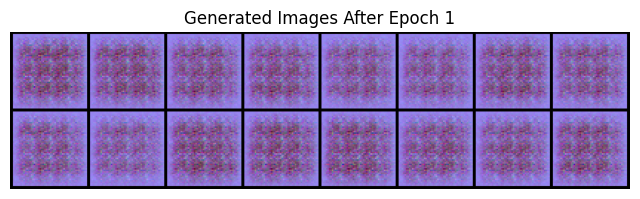

Epoch [2/101] | Loss D: 0.7916, Loss G: 4.1344
Epoch [3/101] | Loss D: 0.7145, Loss G: 2.1943
Epoch [4/101] | Loss D: 0.7183, Loss G: 2.9675
Epoch [5/101] | Loss D: 0.7650, Loss G: 2.7912
Epoch [6/101] | Loss D: 0.8436, Loss G: 3.8967


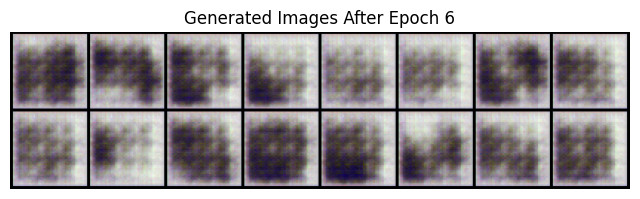

Epoch [7/101] | Loss D: 0.6979, Loss G: 2.7707
Epoch [8/101] | Loss D: 0.6934, Loss G: 2.8773
Epoch [9/101] | Loss D: 0.7251, Loss G: 3.4021
Epoch [10/101] | Loss D: 0.7384, Loss G: 1.5355
Epoch [11/101] | Loss D: 0.8084, Loss G: 1.9642


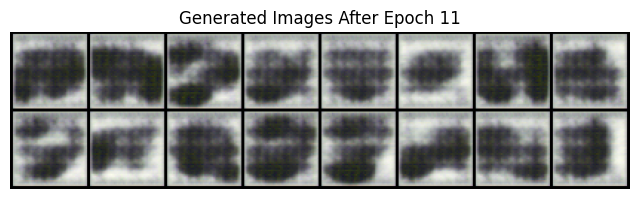

Epoch [12/101] | Loss D: 0.6988, Loss G: 2.0625
Epoch [13/101] | Loss D: 0.7267, Loss G: 2.6259
Epoch [14/101] | Loss D: 0.8010, Loss G: 4.2583
Epoch [15/101] | Loss D: 0.7082, Loss G: 2.2738
Epoch [16/101] | Loss D: 0.6800, Loss G: 2.5078


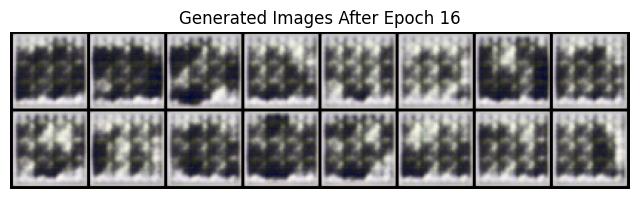

Epoch [17/101] | Loss D: 0.7112, Loss G: 2.9192
Epoch [18/101] | Loss D: 0.7483, Loss G: 3.2057
Epoch [19/101] | Loss D: 0.7187, Loss G: 2.2384
Epoch [20/101] | Loss D: 0.7203, Loss G: 2.4862
Epoch [21/101] | Loss D: 0.6662, Loss G: 2.1874


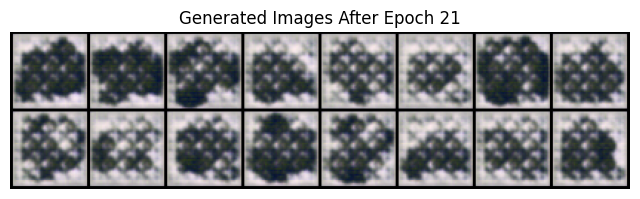

Epoch [22/101] | Loss D: 0.6719, Loss G: 2.1714
Epoch [23/101] | Loss D: 0.6731, Loss G: 2.2391
Epoch [24/101] | Loss D: 1.0863, Loss G: 3.5418
Epoch [25/101] | Loss D: 0.7698, Loss G: 1.8572
Epoch [26/101] | Loss D: 0.6910, Loss G: 2.5028


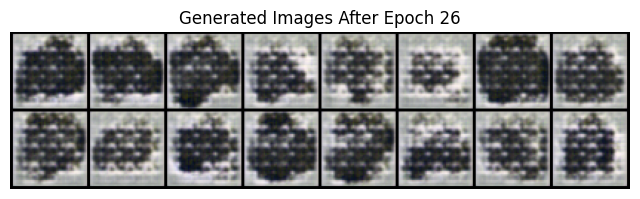

Epoch [27/101] | Loss D: 0.6848, Loss G: 1.8436
Epoch [28/101] | Loss D: 1.3806, Loss G: 4.6921
Epoch [29/101] | Loss D: 0.7017, Loss G: 1.9535
Epoch [30/101] | Loss D: 0.6703, Loss G: 2.3023
Epoch [31/101] | Loss D: 0.6950, Loss G: 2.8440


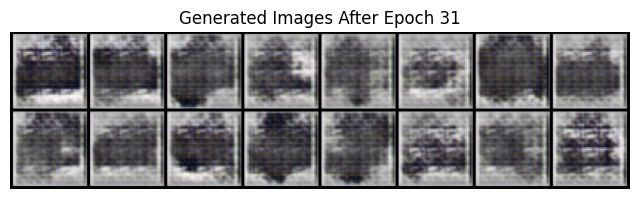

Epoch [32/101] | Loss D: 0.6846, Loss G: 2.3050
Epoch [33/101] | Loss D: 0.7328, Loss G: 1.8633
Epoch [34/101] | Loss D: 0.7304, Loss G: 3.2551
Epoch [35/101] | Loss D: 0.7324, Loss G: 3.0362
Epoch [36/101] | Loss D: 0.7642, Loss G: 3.2822


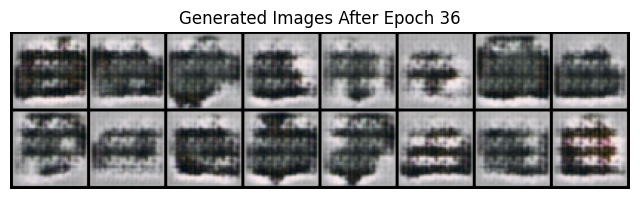

Epoch [37/101] | Loss D: 1.0149, Loss G: 1.7407
Epoch [38/101] | Loss D: 0.6950, Loss G: 1.9799
Epoch [39/101] | Loss D: 0.6999, Loss G: 3.0733
Epoch [40/101] | Loss D: 0.9022, Loss G: 3.2775
Epoch [41/101] | Loss D: 0.8063, Loss G: 3.9586


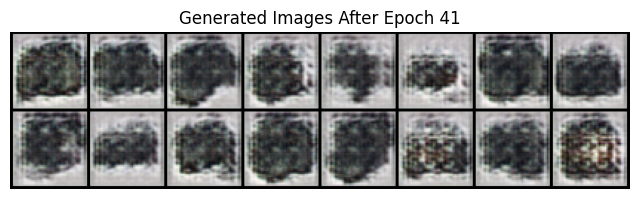

Epoch [42/101] | Loss D: 0.6908, Loss G: 2.0721
Epoch [43/101] | Loss D: 0.7098, Loss G: 2.9008
Epoch [44/101] | Loss D: 0.7112, Loss G: 3.1989
Epoch [45/101] | Loss D: 3.1413, Loss G: 2.8824
Epoch [46/101] | Loss D: 0.8083, Loss G: 3.2475


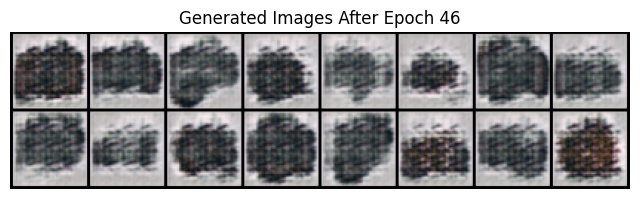

Epoch [47/101] | Loss D: 0.7133, Loss G: 2.5611
Epoch [48/101] | Loss D: 0.6810, Loss G: 2.4647
Epoch [49/101] | Loss D: 1.2751, Loss G: 2.9235
Epoch [50/101] | Loss D: 0.6990, Loss G: 2.3402
Epoch [51/101] | Loss D: 0.6832, Loss G: 2.2506


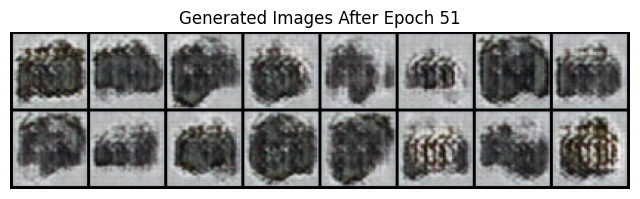

Epoch [52/101] | Loss D: 0.7034, Loss G: 2.5912
Epoch [53/101] | Loss D: 1.2942, Loss G: 5.7152
Epoch [54/101] | Loss D: 0.6910, Loss G: 2.4469
Epoch [55/101] | Loss D: 0.6856, Loss G: 3.0123
Epoch [56/101] | Loss D: 0.8177, Loss G: 3.5300


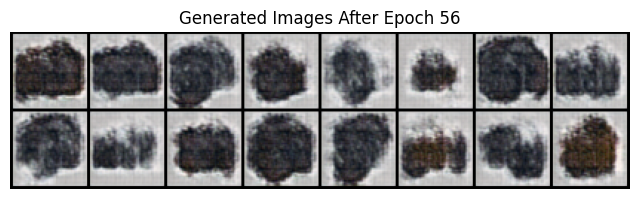

Epoch [57/101] | Loss D: 0.7368, Loss G: 1.9758
Epoch [58/101] | Loss D: 0.7927, Loss G: 3.4644
Epoch [59/101] | Loss D: 0.7240, Loss G: 2.5767
Epoch [60/101] | Loss D: 0.6684, Loss G: 2.3884
Epoch [61/101] | Loss D: 0.6978, Loss G: 1.9899


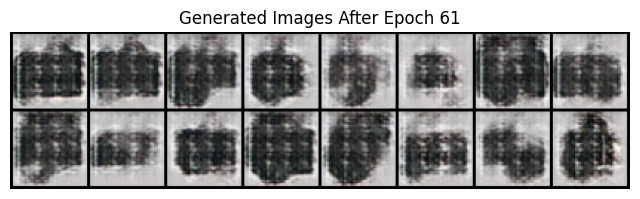

Epoch [62/101] | Loss D: 1.0557, Loss G: 2.8474
Epoch [63/101] | Loss D: 0.8047, Loss G: 1.6156
Epoch [64/101] | Loss D: 0.6809, Loss G: 2.3540
Epoch [65/101] | Loss D: 0.6849, Loss G: 2.2642
Epoch [66/101] | Loss D: 0.7026, Loss G: 2.9568


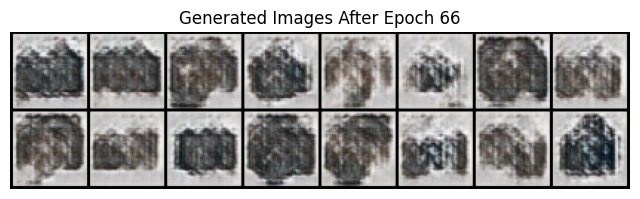

Epoch [67/101] | Loss D: 0.6777, Loss G: 2.2312
Epoch [68/101] | Loss D: 0.7466, Loss G: 2.2733
Epoch [69/101] | Loss D: 0.7847, Loss G: 3.5310
Epoch [70/101] | Loss D: 1.2923, Loss G: 2.5922
Epoch [71/101] | Loss D: 0.6773, Loss G: 2.3199


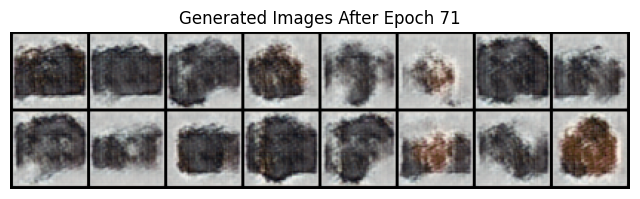

Epoch [72/101] | Loss D: 0.6884, Loss G: 2.0495
Epoch [73/101] | Loss D: 0.6822, Loss G: 2.4179
Epoch [74/101] | Loss D: 0.6857, Loss G: 2.5838
Epoch [75/101] | Loss D: 0.7220, Loss G: 2.8469
Epoch [76/101] | Loss D: 0.7065, Loss G: 2.6968


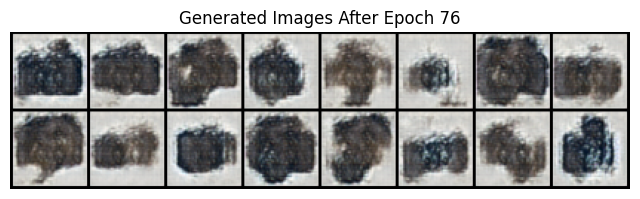

Epoch [77/101] | Loss D: 0.6779, Loss G: 2.3499
Epoch [78/101] | Loss D: 0.7299, Loss G: 2.0259
Epoch [79/101] | Loss D: 0.6884, Loss G: 1.9826
Epoch [80/101] | Loss D: 0.6758, Loss G: 1.9119
Epoch [81/101] | Loss D: 0.6785, Loss G: 2.1902


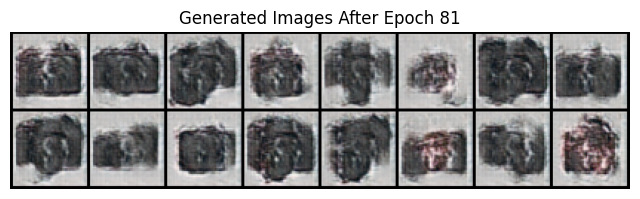

Epoch [82/101] | Loss D: 0.6834, Loss G: 2.4275
Epoch [83/101] | Loss D: 0.6903, Loss G: 2.3280
Epoch [84/101] | Loss D: 0.7211, Loss G: 1.7496
Epoch [85/101] | Loss D: 0.7231, Loss G: 2.5189
Epoch [86/101] | Loss D: 0.6667, Loss G: 2.4070


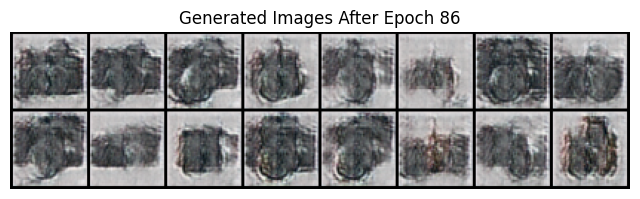

Epoch [87/101] | Loss D: 0.7055, Loss G: 2.8986
Epoch [88/101] | Loss D: 0.8436, Loss G: 2.6225
Epoch [89/101] | Loss D: 0.6812, Loss G: 2.5928
Epoch [90/101] | Loss D: 0.6824, Loss G: 1.9491
Epoch [91/101] | Loss D: 0.6942, Loss G: 2.9425


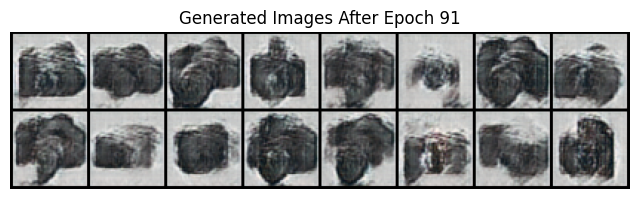

Epoch [92/101] | Loss D: 0.6704, Loss G: 2.0364
Epoch [93/101] | Loss D: 0.7108, Loss G: 2.1947
Epoch [94/101] | Loss D: 0.6840, Loss G: 2.3441
Epoch [95/101] | Loss D: 0.7093, Loss G: 2.6402
Epoch [96/101] | Loss D: 0.7149, Loss G: 1.5958


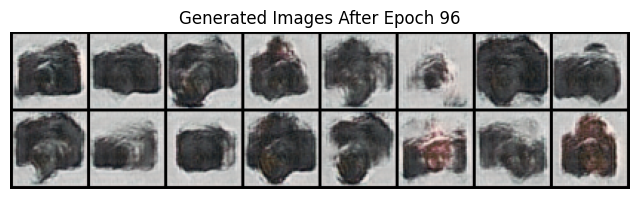

Epoch [97/101] | Loss D: 0.7263, Loss G: 2.7354
Epoch [98/101] | Loss D: 0.6830, Loss G: 2.2810
Epoch [99/101] | Loss D: 0.7570, Loss G: 2.1733
Epoch [100/101] | Loss D: 0.7772, Loss G: 2.9844
Epoch [101/101] | Loss D: 0.6998, Loss G: 1.5263


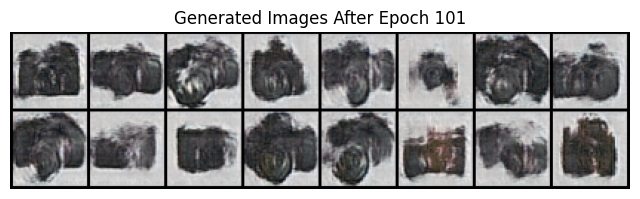

Training Complete!


In [16]:
writer = SummaryWriter(cfg.log_dir)

loss_G_history = []
loss_D_history = []

print("Starting GAN training...")

try:
    global_step = 0

    for epoch in range(cfg.epochs):
        for batch_idx, real_imgs in enumerate(data_loader):
            batch_size = real_imgs.size(0)
            real_imgs = real_imgs.to(cfg.device_type)

            labels_real = torch.full((batch_size,), 0.9, device=cfg.device_type)
            labels_fake = torch.full((batch_size,), 0.1, device=cfg.device_type)

            discriminator.zero_grad()
            output_real = discriminator(real_imgs).view(-1)
            loss_D_real = criterion_loss(output_real, labels_real)
            loss_D_real.backward()

            noise = torch.randn(batch_size, cfg.latent_dim, 1, 1, device=cfg.device_type)
            fake_imgs = generator(noise)
            output_fake = discriminator(fake_imgs.detach()).view(-1)
            loss_D_fake = criterion_loss(output_fake, labels_fake)
            loss_D_fake.backward()

            loss_D = loss_D_real + loss_D_fake
            optimizer_D.step()

            generator.zero_grad()
            output_gen = discriminator(fake_imgs).view(-1)
            loss_G = criterion_loss(output_gen, labels_real)
            loss_G.backward()
            optimizer_G.step()

            loss_G_history.append(loss_G.item())
            loss_D_history.append(loss_D.item())

            writer.add_scalar('Loss/Generator', loss_G.item(), global_step)
            writer.add_scalar('Loss/Discriminator', loss_D.item(), global_step)

            if global_step % 10 == 0:
                with torch.no_grad():
                    fake_samples = generator(fixed_noise_samples).cpu()
                grid = vutils.make_grid(fake_samples, padding=2, normalize=True)
                writer.add_image('Generated Images (Every 10 Steps)', grid, global_step)

            global_step += 1

        with torch.no_grad():
            fake_samples = generator(fixed_noise_samples).cpu()
        grid = vutils.make_grid(fake_samples, padding=2, normalize=True)
        writer.add_image('Generated Images Epoch', grid, epoch)

        print(f"Epoch [{epoch+1}/{cfg.epochs}] | Loss D: {loss_D.item():.4f}, Loss G: {loss_G.item():.4f}")

        if epoch % 5 == 0:
            plt.figure(figsize=(8, 8))
            plt.title(f"Generated Images After Epoch {epoch+1}")
            plt.imshow(np.transpose(grid, (1, 2, 0)))
            plt.axis("off")
            plt.show()

    print("Training Complete!")

finally:
    writer.close()

# Проверка качества модели

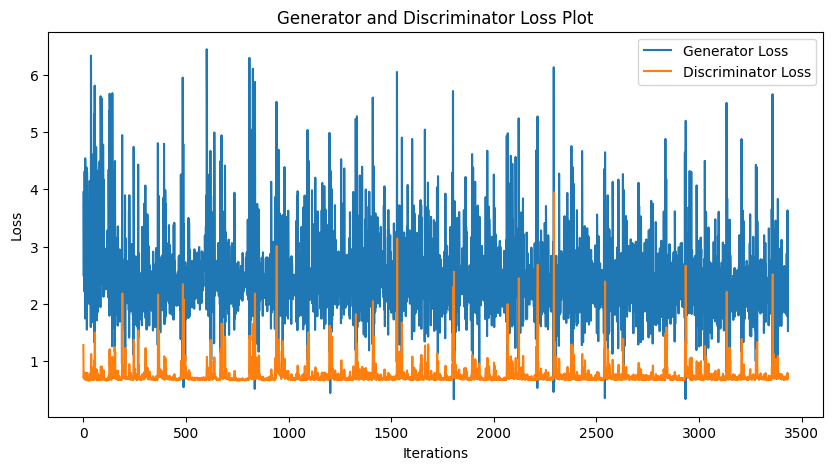

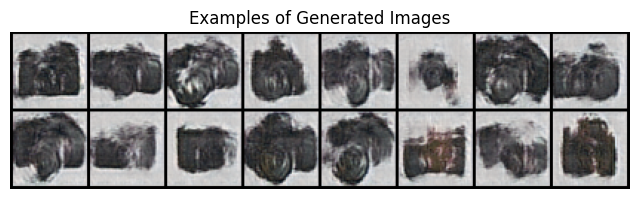

In [17]:
plt.figure(figsize=(10,5))
plt.title("Generator and Discriminator Loss Plot")
plt.plot(loss_G_history, label="Generator Loss")
plt.plot(loss_D_history, label="Discriminator Loss")
plt.xlabel("Iterations")
plt.ylabel("Loss")
plt.legend()
plt.show()

with torch.no_grad():
    final_fake = generator(fixed_noise_samples).cpu()

grid_final = vutils.make_grid(final_fake, padding=2, normalize=True)
writer.add_image('Final Generated Images', grid_final, cfg.epochs)

plt.figure(figsize=(8,8))
plt.axis("off")
plt.title("Examples of Generated Images")
plt.imshow(np.transpose(grid_final, (1,2,0)))
plt.show()

In [18]:
%load_ext tensorboard
%tensorboard --logdir=/content/drive/MyDrive/ml/generative/runs/gan_experiment

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


Reusing TensorBoard on port 6006 (pid 1561), started 0:19:46 ago. (Use '!kill 1561' to kill it.)

<IPython.core.display.Javascript object>

# Latent Space Interpolation

In [26]:
def interpolate_between_z(z_start, z_end, num_steps=10):
    alphas = np.linspace(0, 1, num_steps)
    interpolated_z = [(1 - alpha) * z_start + alpha * z_end for alpha in alphas]
    return torch.stack(interpolated_z)

z_start = torch.randn(cfg.latent_dim, device=cfg.device_type)
z_end = torch.randn(cfg.latent_dim, device=cfg.device_type)
interpolated_z = interpolate_between_z(z_start, z_end, num_steps=50).unsqueeze(-1).unsqueeze(-1)

with torch.no_grad():
    interpolated_images = generator(interpolated_z).cpu()

interpolated_images = (interpolated_images + 1) / 2
image_frames = [transforms.ToPILImage()(img) for img in interpolated_images]

gif_path = "/content/drive/MyDrive/ml/generative/camera_latent_interpolation.gif"
imageio.mimsave(gif_path, image_frames, fps=5)
print(f"GIF saved at {gif_path}")

GIF saved at /content/drive/MyDrive/ml/generative/camera_latent_interpolation.gif


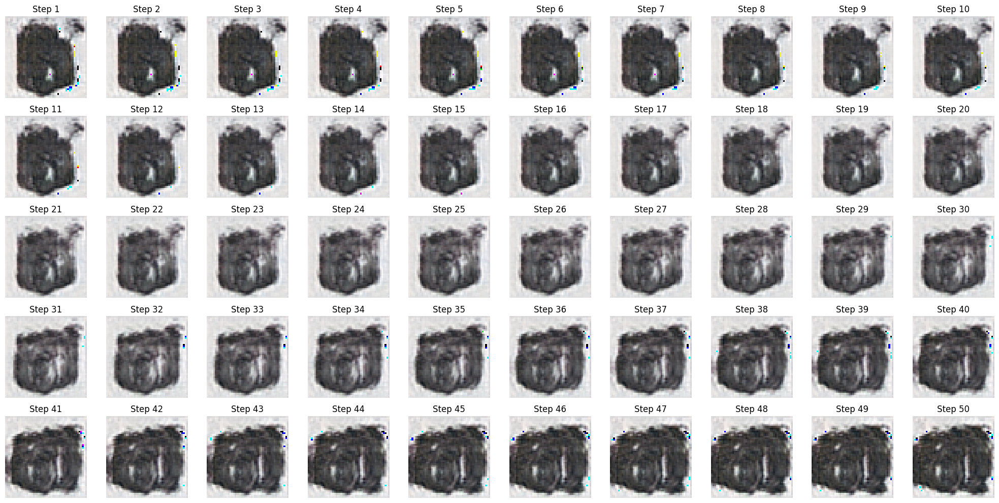

In [27]:
rows = 5
cols = 10
fig, axes = plt.subplots(rows, cols, figsize=(20, 10))
axes = axes.flatten()

for img, ax, idx in zip(image_frames, axes, range(len(image_frames))):
    ax.imshow(img)
    ax.axis("off")
    ax.set_title(f"Step {idx+1}")

for ax in axes[len(image_frames):]:
    ax.axis("off")

plt.tight_layout()
plt.show()

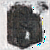

In [28]:
display(IPImage(filename=gif_path))